In [1]:
import tensorflow as tf
from tensorflow import keras
import pandas as pd
from sklearn.utils import shuffle
import numpy as np
import scipy.io
from keras.utils import np_utils
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model
from keras.models import Sequential
from keras.layers import Dense
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix
import seaborn as sn
import matplotlib.pyplot as plt;
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report


In [2]:
# Define the number of trials that we want to do:
number_Of_Trials=5;

In [3]:
# Number of epochs
num_eopchs=2000;

In [4]:
# Patience
ptnc=200;

In [5]:
# Root folder of the datasets
root_folder_="D:/Master/newDiplom/my_Paper/Submission Files_ v15/CWRU_Code/Datasets/";

In [6]:
# Root folder of Models
root_modles='d:/Data/Models/';

In [7]:
# Number of classes
myN=10;

In [8]:

# Buidling neural network model
def build_my_model(numberOfClasses):
    model = Sequential()
    model.add(Dense(50, input_dim=50, activation="tanh"))
    #model.add(Dense(numberOfClasses))
    model.add(Dense(numberOfClasses, activation="softmax"))
    model.compile(loss="categorical_crossentropy",optimizer='adam', metrics=["accuracy"]) 
    #opt = tf.keras.optimizers.Adam(learning_rate=1e-4, decay=1e-3 / 200)
    #model.compile(optimizer='adam',
    #             loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    #             metrics=['accuracy'])
    print(model.summary())
    return model;

In [9]:
# Function for do iterations

def do_Iterations(bestModelName):
    # Define an array to save reults of each trial of each expirement
    # It is used to calculate the average of each expirement
    temp_results=np.zeros(number_Of_Trials)

    for i in range(number_Of_Trials):

        #Loading training data
        data = pd.read_csv(path_to_train,header=None)
        data = data.iloc[np.random.permutation(len(data))]
        labels=data.iloc[:,51]
        features = data.iloc[:,1:51]
        X=features
        y=np.ravel(labels)
        X_train, y_train = shuffle(X, y)
        print(X_train.shape)

        #Loading testing data
        data12 = pd.read_csv(path_to_test,header=None)
        labels12=data12.iloc[:,51]
        features12 = data12.iloc[:,1:51]
        X12=features12
        y12=np.ravel(labels12)
        X_test=X12;
        y_test=y12;
        print(X_test.shape)


        # Making target data in range [0,9]
        y_train=y_train-1;
        y_test=y_test-1;

        # Convert to categorical
        Y_train = np_utils.to_categorical(y_train, myN) 
        Y_test = np_utils.to_categorical(y_test, myN)
        Y_test.shape

        # Training model
        checkpoint_path=root_modles+bestModelName+'_iter_'+str(i)+'.h5'
        keras_callbacks   = [
              EarlyStopping(monitor='val_loss', patience=ptnc, verbose=1),
              ModelCheckpoint(checkpoint_path, monitor='val_loss', save_best_only=True)
        ]


        model=build_my_model(myN);
        history=model.fit(X_train, Y_train,epochs=num_eopchs, batch_size=27, verbose=1, validation_split=0.1,callbacks=[keras_callbacks])
        best_model = load_model(checkpoint_path)
        model=best_model;
        # Calculate score
        scores = model.evaluate(X_test, Y_test, verbose=2) 
        temp_results[i]=scores[1]
        print('==========================================')
        print("Iteration Number= " +str(i+1)+" ;Accuracy=  %.2f%%" % scores[1]*100)
        print('==========================================')
    return model,X_test,Y_test,history,temp_results;

# Testing Sub-dataset #1

(747, 50)
(319, 50)
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 50)                2550      
_________________________________________________________________
dense_1 (Dense)              (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
25/25 [==============================] - 13s 19ms/step - loss: 2.3845 - accuracy: 0.1468 - val_loss: 2.0614 - val_accuracy: 0.3067
Epoch 2/2000
25/25 [==============================] - 0s 1ms/step - loss: 1.9915 - accuracy: 0.3112 - val_loss: 1.8603 - val_accuracy: 0.3867
Epoch 3/2000
25/25 [==============================] - 0s 1ms/step - loss: 1.8017 - accuracy: 0.3786 - val_loss: 1.7005 - val_accuracy: 0.5067
Epoch 4/2000
25/25 [==============================] - 0s 1ms/st

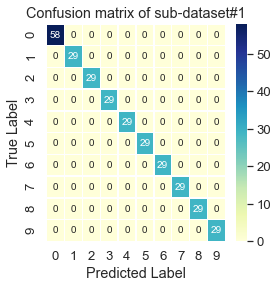

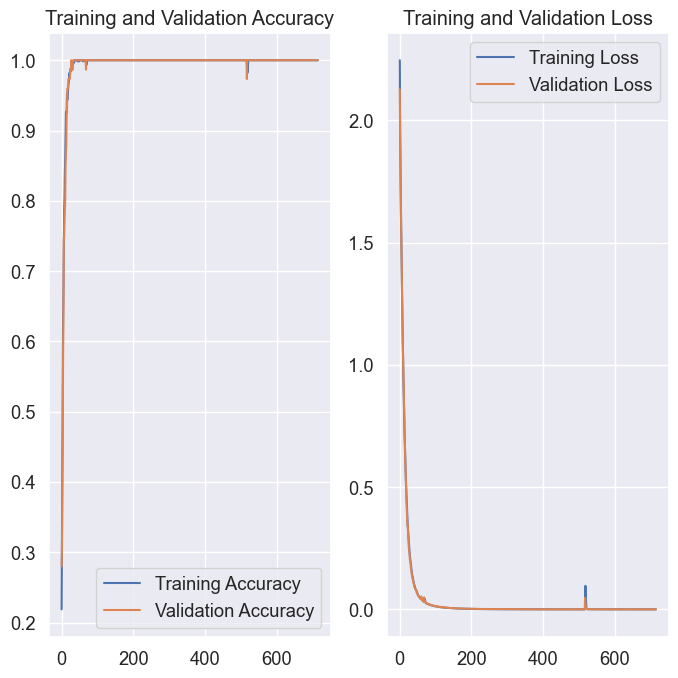

In [10]:
# Title of confusin matrix we want to show:
confusion_title="Confusion matrix of sub-dataset#1"

# Path to train
path_to_train=root_folder_+"0/2500/Z_0_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"0/2500/Z_0_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"


# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_0_0')

# Draw confusion matrix (It is only for the last trial)

predictions=model.predict(X_test);
confusion=confusion_matrix(np.argmax(Y_test,axis=1),np.argmax(predictions,axis=1));


dataset_labels=np.array(['0','1','2','3','4','5','6','7','8','9'])
##
df_cm = pd.DataFrame(confusion, 
                      dataset_labels, 
                      dataset_labels)
sn.set(font_scale=1.2) # for label size
plt.figure(figsize=(4,4))
sn.heatmap(df_cm,annot=True,annot_kws={"size": 10},fmt = "d",linewidths=.5,cmap="YlGnBu") 
plt.title(confusion_title)
plt.ylabel("True Label")
plt.xlabel("Predicted Label")

# Print classification report

print('CLASSIFICATION REPORT\n',
        classification_report(np.argmax(Y_test, axis=1), 
                              np.argmax(predictions, axis=1), 
                              target_names=dataset_labels))

# Plot Training and Validation Accuracy and  Training and Validation Loss

plt.rcParams['figure.dpi'] = 100

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.history['loss']))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [11]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 100.00%


# Testing Sub-dataset #2

(881, 50)
(377, 50)
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_11 (Dense)             (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 8ms/step - loss: 2.3049 - accuracy: 0.1417 - val_loss: 1.8073 - val_accuracy: 0.4270
Epoch 2/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.8339 - accuracy: 0.3818 - val_loss: 1.5025 - val_accuracy: 0.4382
Epoch 3/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.5623 - accuracy: 0.4461 - val_loss: 1.3347 - val_accuracy: 0.5169
Epoch 4/2000
30/30 [==============================] - 0s 1ms/st

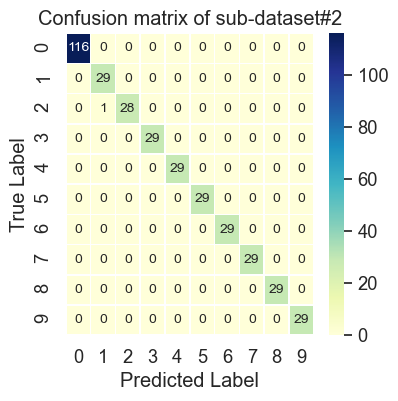

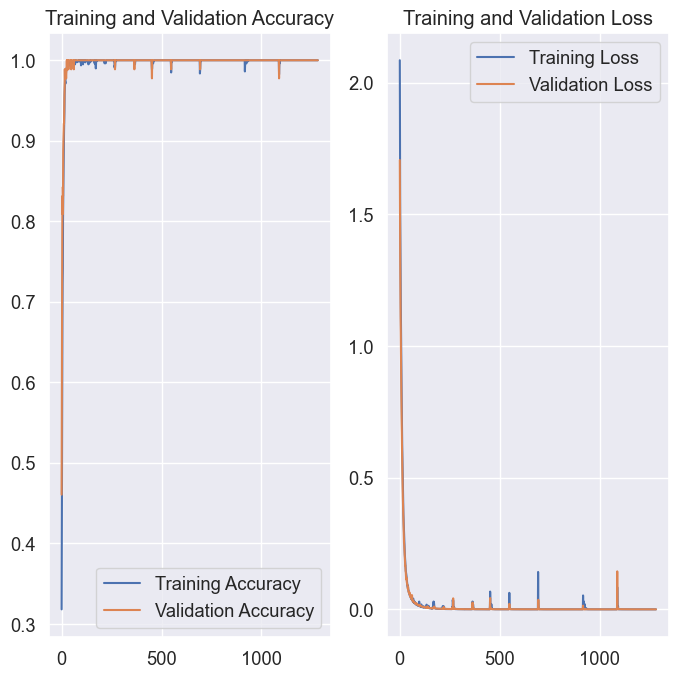

In [12]:
# Title of confusin matrix we want to show:
confusion_title="Confusion matrix of sub-dataset#2"

# Path to train
path_to_train=root_folder_+"1/2500/Z_1_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"1/2500/Z_1_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_1_1')
    
# Draw confusion matrix (It is only for the last trial)

predictions=model.predict(X_test);
confusion=confusion_matrix(np.argmax(Y_test,axis=1),np.argmax(predictions,axis=1));


dataset_labels=np.array(['0','1','2','3','4','5','6','7','8','9'])
##
df_cm = pd.DataFrame(confusion, 
                      dataset_labels, 
                      dataset_labels)
sn.set(font_scale=1.2) # for label size
plt.figure(figsize=(4,4))
sn.heatmap(df_cm,annot=True,annot_kws={"size": 10},fmt = "d",linewidths=.5,cmap="YlGnBu") 
plt.title(confusion_title)
plt.ylabel("True Label")
plt.xlabel("Predicted Label")

# Print classification report

print('CLASSIFICATION REPORT\n',
        classification_report(np.argmax(Y_test, axis=1), 
                              np.argmax(predictions, axis=1), 
                              target_names=dataset_labels))

# Plot Training and Validation Accuracy and  Training and Validation Loss

plt.rcParams['figure.dpi'] = 100

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.history['loss']))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [13]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 99.73%


# Testing Sub-dataset #3

(881, 50)
(377, 50)
Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_20 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_21 (Dense)             (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 8ms/step - loss: 2.1602 - accuracy: 0.3115 - val_loss: 1.7616 - val_accuracy: 0.4045
Epoch 2/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.7122 - accuracy: 0.4334 - val_loss: 1.4960 - val_accuracy: 0.4944
Epoch 3/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.4891 - accuracy: 0.5099 - val_loss: 1.3477 - val_accuracy: 0.6292
Epoch 4/2000
30/30 [==============================] - 0s 1ms/s

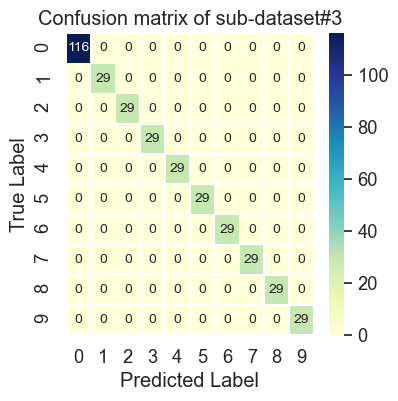

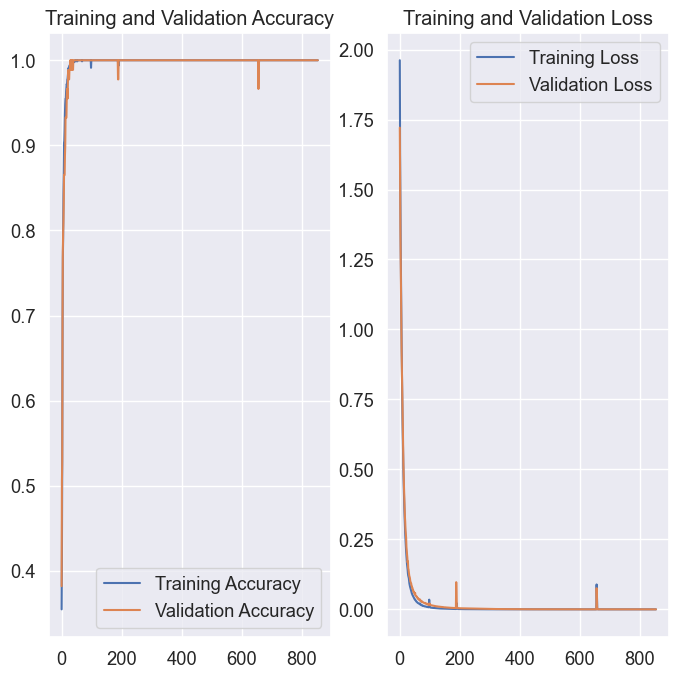

In [14]:
# Title of confusin matrix we want to show:
confusion_title="Confusion matrix of sub-dataset#3"

# Path to train
path_to_train=root_folder_+"2/2500/Z_2_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"2/2500/Z_2_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_2_2')

# Draw confusion matrix (It is only for the last trial)

predictions=model.predict(X_test);
confusion=confusion_matrix(np.argmax(Y_test,axis=1),np.argmax(predictions,axis=1));


dataset_labels=np.array(['0','1','2','3','4','5','6','7','8','9'])
##
df_cm = pd.DataFrame(confusion, 
                      dataset_labels, 
                      dataset_labels)
sn.set(font_scale=1.2) # for label size
plt.figure(figsize=(4,4))
sn.heatmap(df_cm,annot=True,annot_kws={"size": 10},fmt = "d",linewidths=.5,cmap="YlGnBu") 
plt.title(confusion_title)
plt.ylabel("True Label")
plt.xlabel("Predicted Label")

# Print classification report

print('CLASSIFICATION REPORT\n',
        classification_report(np.argmax(Y_test, axis=1), 
                              np.argmax(predictions, axis=1), 
                              target_names=dataset_labels))

# Plot Training and Validation Accuracy and  Training and Validation Loss

plt.rcParams['figure.dpi'] = 100

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.history['loss']))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [15]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 100.00%


# Testing Sub-dataset #4

(883, 50)
(377, 50)
Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_30 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_31 (Dense)             (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 8ms/step - loss: 2.4370 - accuracy: 0.1245 - val_loss: 1.9504 - val_accuracy: 0.3371
Epoch 2/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.8108 - accuracy: 0.3936 - val_loss: 1.7172 - val_accuracy: 0.3596
Epoch 3/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.5530 - accuracy: 0.4762 - val_loss: 1.5553 - val_accuracy: 0.4607
Epoch 4/2000
30/30 [==============================] - 0s 1ms/s

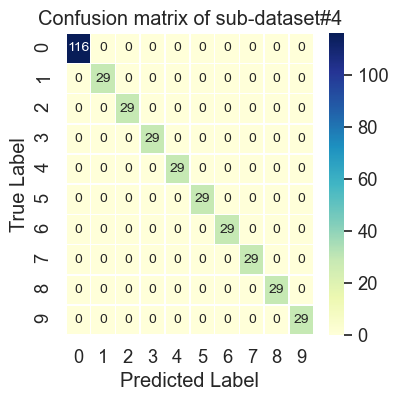

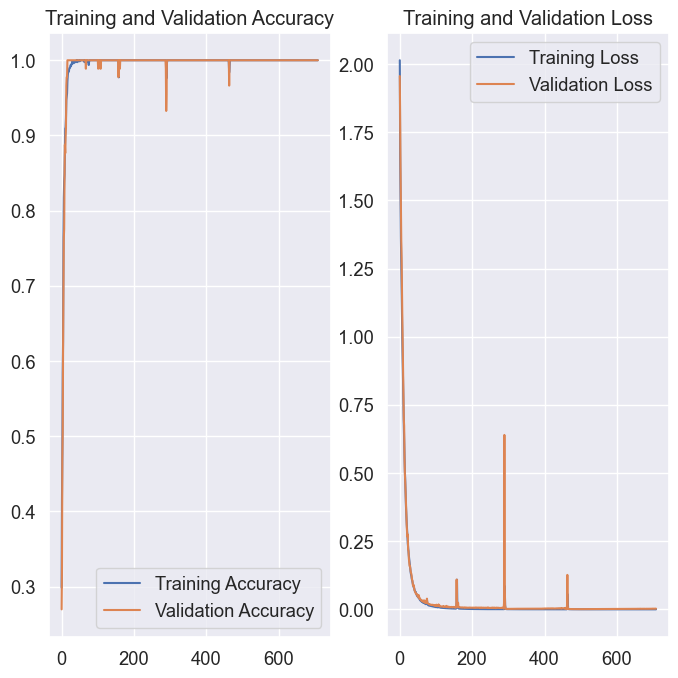

In [16]:
# Title of confusin matrix we want to show:
confusion_title="Confusion matrix of sub-dataset#4"

# Path to train
path_to_train=root_folder_+"3/2500/Z_3_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"3/2500/Z_3_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_3_3')

# Draw confusion matrix (It is only for the last trial)

predictions=model.predict(X_test);
confusion=confusion_matrix(np.argmax(Y_test,axis=1),np.argmax(predictions,axis=1));


dataset_labels=np.array(['0','1','2','3','4','5','6','7','8','9'])
##
df_cm = pd.DataFrame(confusion, 
                      dataset_labels, 
                      dataset_labels)
sn.set(font_scale=1.2) # for label size
plt.figure(figsize=(4,4))
sn.heatmap(df_cm,annot=True,annot_kws={"size": 10},fmt = "d",linewidths=.5,cmap="YlGnBu") 
plt.title(confusion_title)
plt.ylabel("True Label")
plt.xlabel("Predicted Label")

# Print classification report

print('CLASSIFICATION REPORT\n',
        classification_report(np.argmax(Y_test, axis=1), 
                              np.argmax(predictions, axis=1), 
                              target_names=dataset_labels))

# Plot Training and Validation Accuracy and  Training and Validation Loss

plt.rcParams['figure.dpi'] = 100

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.history['loss']))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [17]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 100.00%


# Testing Entire dataset

(3392, 50)
(1450, 50)
Model: "sequential_20"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_40 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_41 (Dense)             (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
114/114 [==============================] - 1s 2ms/step - loss: 1.9049 - accuracy: 0.3513 - val_loss: 1.3123 - val_accuracy: 0.6235
Epoch 2/2000
114/114 [==============================] - 0s 844us/step - loss: 1.2982 - accuracy: 0.6156 - val_loss: 0.9964 - val_accuracy: 0.7618
Epoch 3/2000
114/114 [==============================] - 0s 840us/step - loss: 0.9812 - accuracy: 0.8137 - val_loss: 0.7496 - val_accuracy: 0.8618
Epoch 4/2000
114/114 [============================

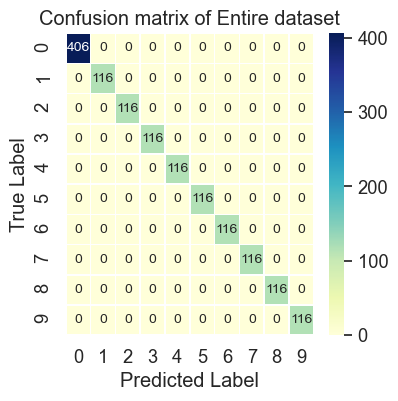

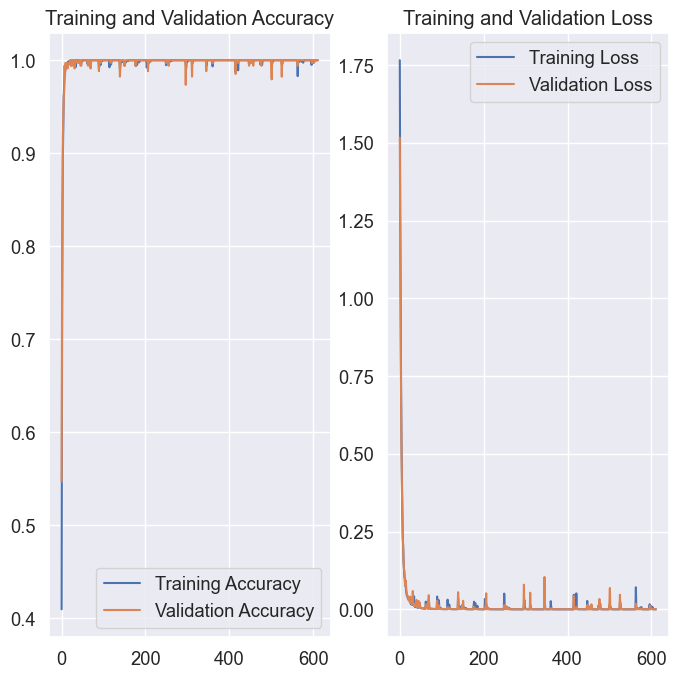

In [18]:
# Title of confusin matrix we want to show:
confusion_title="Confusion matrix of Entire dataset"

# Path to train
path_to_train=root_folder_+"ALL/2500/Z_ALL_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"ALL/2500/Z_ALL_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_ALL_ALL')

# Draw confusion matrix (It is only for the last trial)

predictions=model.predict(X_test);
confusion=confusion_matrix(np.argmax(Y_test,axis=1),np.argmax(predictions,axis=1));


dataset_labels=np.array(['0','1','2','3','4','5','6','7','8','9'])
##
df_cm = pd.DataFrame(confusion, 
                      dataset_labels, 
                      dataset_labels)
sn.set(font_scale=1.2) # for label size
plt.figure(figsize=(4,4))
sn.heatmap(df_cm,annot=True,annot_kws={"size": 10},fmt = "d",linewidths=.5,cmap="YlGnBu") 
plt.title(confusion_title)
plt.ylabel("True Label")
plt.xlabel("Predicted Label")

# Print classification report

print('CLASSIFICATION REPORT\n',
        classification_report(np.argmax(Y_test, axis=1), 
                              np.argmax(predictions, axis=1), 
                              target_names=dataset_labels))

# Plot Training and Validation Accuracy and  Training and Validation Loss

plt.rcParams['figure.dpi'] = 100

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(history.history['loss']))

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [19]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 100.00%


# Training Sub-dataset #1 Predicting Sub-dataset #2

In [20]:
# Path to train
path_to_train=root_folder_+"0/2500/Z_0_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"1/2500/Z_1_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_0_1')


(747, 50)
(377, 50)
Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_50 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_51 (Dense)             (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
25/25 [==============================] - 1s 10ms/step - loss: 2.4587 - accuracy: 0.0488 - val_loss: 2.1395 - val_accuracy: 0.2267
Epoch 2/2000
25/25 [==============================] - 0s 1ms/step - loss: 2.0691 - accuracy: 0.2432 - val_loss: 1.9116 - val_accuracy: 0.2400
Epoch 3/2000
25/25 [==============================] - 0s 1ms/step - loss: 1.8710 - accuracy: 0.3185 - val_loss: 1.7495 - val_accuracy: 0.3867
Epoch 4/2000
25/25 [==============================] - 0s 1ms/

In [21]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 97.24%


# Training Sub-dataset #1 Predicting Sub-dataset #3

In [22]:
# Path to train
path_to_train=root_folder_+"0/2500/Z_0_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"2/2500/Z_2_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_0_2')


(747, 50)
(377, 50)
Model: "sequential_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_60 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_61 (Dense)             (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
25/25 [==============================] - 1s 8ms/step - loss: 2.3005 - accuracy: 0.1782 - val_loss: 1.9890 - val_accuracy: 0.4133
Epoch 2/2000
25/25 [==============================] - 0s 1ms/step - loss: 1.9562 - accuracy: 0.3916 - val_loss: 1.7830 - val_accuracy: 0.5333
Epoch 3/2000
25/25 [==============================] - 0s 1ms/step - loss: 1.7622 - accuracy: 0.5199 - val_loss: 1.6290 - val_accuracy: 0.5200
Epoch 4/2000
25/25 [==============================] - 0s 987us

In [23]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 92.10%


# Training Sub-dataset #1 Predicting Sub-dataset #4

In [24]:
# Path to train
path_to_train=root_folder_+"0/2500/Z_0_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"3/2500/Z_3_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_0_3')


(747, 50)
(377, 50)
Model: "sequential_35"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_70 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_71 (Dense)             (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
25/25 [==============================] - 1s 19ms/step - loss: 2.3548 - accuracy: 0.1849 - val_loss: 1.9536 - val_accuracy: 0.3733
Epoch 2/2000
25/25 [==============================] - 0s 1ms/step - loss: 1.9822 - accuracy: 0.3121 - val_loss: 1.7342 - val_accuracy: 0.4267
Epoch 3/2000
25/25 [==============================] - 0s 955us/step - loss: 1.7844 - accuracy: 0.3796 - val_loss: 1.5757 - val_accuracy: 0.4267
Epoch 4/2000
25/25 [==============================] - 0s 2m

In [25]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 88.49%


# Training Sub-dataset #2 Predicting Sub-dataset #1

In [26]:
# Path to train
path_to_train=root_folder_+"1/2500/Z_1_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"0/2500/Z_0_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_1_0')

(881, 50)
(319, 50)
Model: "sequential_40"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_80 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_81 (Dense)             (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 7ms/step - loss: 2.2668 - accuracy: 0.2153 - val_loss: 1.8443 - val_accuracy: 0.3483
Epoch 2/2000
30/30 [==============================] - 0s 936us/step - loss: 1.7657 - accuracy: 0.3687 - val_loss: 1.6104 - val_accuracy: 0.4831
Epoch 3/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.5291 - accuracy: 0.4519 - val_loss: 1.4863 - val_accuracy: 0.4494
Epoch 4/2000
30/30 [==============================] - 0s 1ms

In [27]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 99.12%


# Training Sub-dataset #2 Predicting Sub-dataset #3

In [28]:
# Path to train
path_to_train=root_folder_+"1/2500/Z_1_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"2/2500/Z_2_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_1_2')



(881, 50)
(377, 50)
Model: "sequential_45"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_90 (Dense)             (None, 50)                2550      
_________________________________________________________________
dense_91 (Dense)             (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 8ms/step - loss: 2.0300 - accuracy: 0.3703 - val_loss: 1.7572 - val_accuracy: 0.4157
Epoch 2/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.6247 - accuracy: 0.4378 - val_loss: 1.5828 - val_accuracy: 0.5506
Epoch 3/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.4433 - accuracy: 0.5691 - val_loss: 1.4559 - val_accuracy: 0.5955
Epoch 4/2000
30/30 [==============================] - 0s 1ms/s

In [29]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 98.57%


# Training Sub-dataset #2 Predicting Sub-dataset #4

In [30]:
# Path to train
path_to_train=root_folder_+"1/2500/Z_1_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"3/2500/Z_3_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_1_3')


(881, 50)
(377, 50)
Model: "sequential_50"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_100 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_101 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 8ms/step - loss: 2.2219 - accuracy: 0.2605 - val_loss: 1.8096 - val_accuracy: 0.4494
Epoch 2/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.7734 - accuracy: 0.4245 - val_loss: 1.5467 - val_accuracy: 0.5056
Epoch 3/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.5491 - accuracy: 0.4867 - val_loss: 1.3699 - val_accuracy: 0.5618
Epoch 4/2000
30/30 [==============================] - 0s 1ms/s

In [31]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 90.82%


# Training Sub-dataset #3 Predicting Sub-dataset #1

In [32]:
# Path to train
path_to_train=root_folder_+"2/2500/Z_2_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"0/2500/Z_0_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_2_0')


(881, 50)
(319, 50)
Model: "sequential_55"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_110 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_111 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 22ms/step - loss: 2.3190 - accuracy: 0.2108 - val_loss: 1.9193 - val_accuracy: 0.3258
Epoch 2/2000
30/30 [==============================] - 0s 2ms/step - loss: 1.7614 - accuracy: 0.4028 - val_loss: 1.6243 - val_accuracy: 0.5056
Epoch 3/2000
30/30 [==============================] - 0s 2ms/step - loss: 1.5557 - accuracy: 0.4949 - val_loss: 1.4359 - val_accuracy: 0.6742
Epoch 4/2000
30/30 [==============================] - 0s 2ms/

In [33]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 92.85%


# Training Sub-dataset #3 Predicting Sub-dataset #2

In [34]:
# Path to train
path_to_train=root_folder_+"2/2500/Z_2_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"1/2500/Z_1_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"


# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_2_1')

(881, 50)
(377, 50)
Model: "sequential_60"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_120 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_121 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 11ms/step - loss: 2.5702 - accuracy: 0.1301 - val_loss: 2.0271 - val_accuracy: 0.3034
Epoch 2/2000
30/30 [==============================] - 0s 2ms/step - loss: 1.8470 - accuracy: 0.3543 - val_loss: 1.6774 - val_accuracy: 0.3596
Epoch 3/2000
30/30 [==============================] - 0s 2ms/step - loss: 1.5895 - accuracy: 0.4015 - val_loss: 1.4599 - val_accuracy: 0.4831
Epoch 4/2000
30/30 [==============================] - 0s 2ms/

In [35]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 96.92%


# Training Sub-dataset #3 Predicting Sub-dataset #4

In [36]:
# Path to train
path_to_train=root_folder_+"2/2500/Z_2_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"3/2500/Z_3_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_2_3')


(881, 50)
(377, 50)
Model: "sequential_65"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_130 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_131 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 10ms/step - loss: 2.3153 - accuracy: 0.2324 - val_loss: 1.9681 - val_accuracy: 0.2921
Epoch 2/2000
30/30 [==============================] - 0s 2ms/step - loss: 1.7960 - accuracy: 0.3648 - val_loss: 1.7127 - val_accuracy: 0.3820
Epoch 3/2000
30/30 [==============================] - 0s 2ms/step - loss: 1.6012 - accuracy: 0.4637 - val_loss: 1.5373 - val_accuracy: 0.4831
Epoch 4/2000
30/30 [==============================] - 0s 922u

In [37]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 97.35%


# Training Sub-dataset #4 Predicting Sub-dataset #1

In [38]:
# Path to train
path_to_train=root_folder_+"3/2500/Z_3_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"0/2500/Z_0_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"


# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_3_0')



(883, 50)
(319, 50)
Model: "sequential_70"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_140 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_141 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 8ms/step - loss: 2.2146 - accuracy: 0.1946 - val_loss: 1.7790 - val_accuracy: 0.3820
Epoch 2/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.8136 - accuracy: 0.3265 - val_loss: 1.5561 - val_accuracy: 0.4157
Epoch 3/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.5267 - accuracy: 0.4541 - val_loss: 1.4037 - val_accuracy: 0.5730
Epoch 4/2000
30/30 [==============================] - 0s 1ms/s

In [39]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 84.83%


# Training Sub-dataset #4 Predicting Sub-dataset #2

In [40]:
# Path to train
path_to_train=root_folder_+"3/2500/Z_3_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"1/2500/Z_1_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_3_1')



(883, 50)
(377, 50)
Model: "sequential_75"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_150 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_151 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 11ms/step - loss: 2.2807 - accuracy: 0.2133 - val_loss: 1.8543 - val_accuracy: 0.3708
Epoch 2/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.8204 - accuracy: 0.3417 - val_loss: 1.6326 - val_accuracy: 0.4382
Epoch 3/2000
30/30 [==============================] - 0s 1ms/step - loss: 1.6058 - accuracy: 0.4235 - val_loss: 1.4654 - val_accuracy: 0.5281
Epoch 4/2000
30/30 [==============================] - 0s 2ms/

In [41]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 93.47%


# Training Sub-dataset #4 Predicting Sub-dataset #3

In [42]:
# Path to train
path_to_train=root_folder_+"3/2500/Z_3_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"2/2500/Z_2_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_3_2')

(883, 50)
(377, 50)
Model: "sequential_80"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_160 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_161 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
30/30 [==============================] - 1s 12ms/step - loss: 2.3160 - accuracy: 0.2047 - val_loss: 1.9176 - val_accuracy: 0.3483
Epoch 2/2000
30/30 [==============================] - 0s 2ms/step - loss: 1.8329 - accuracy: 0.3457 - val_loss: 1.6416 - val_accuracy: 0.4607
Epoch 3/2000
30/30 [==============================] - 0s 2ms/step - loss: 1.5767 - accuracy: 0.4744 - val_loss: 1.4749 - val_accuracy: 0.4831
Epoch 4/2000
30/30 [==============================] - 0s 2ms/

In [43]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 97.77%


# Training Entire dataset  Predicting Sub-dataset #1

In [44]:
# Path to train
path_to_train=root_folder_+"ALL/2500/Z_ALL_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"0/2500/Z_0_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_ALL_0')

(3392, 50)
(319, 50)
Model: "sequential_85"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_170 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_171 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
114/114 [==============================] - 1s 3ms/step - loss: 2.0820 - accuracy: 0.2463 - val_loss: 1.4865 - val_accuracy: 0.5412
Epoch 2/2000
114/114 [==============================] - 0s 1ms/step - loss: 1.3920 - accuracy: 0.5705 - val_loss: 1.1364 - val_accuracy: 0.7294
Epoch 3/2000
114/114 [==============================] - 0s 1ms/step - loss: 1.0771 - accuracy: 0.7357 - val_loss: 0.8457 - val_accuracy: 0.8824
Epoch 4/2000
114/114 [==============================] -

In [45]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 100.00%


# Training Entire dataset  Predicting Sub-dataset #2

In [46]:
# Path to train
path_to_train=root_folder_+"ALL/2500/Z_ALL_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"1/2500/Z_1_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_ALL_1')

(3392, 50)
(377, 50)
Model: "sequential_90"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_180 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_181 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
114/114 [==============================] - 2s 6ms/step - loss: 2.0279 - accuracy: 0.3110 - val_loss: 1.3853 - val_accuracy: 0.5912
Epoch 2/2000
114/114 [==============================] - 0s 1ms/step - loss: 1.3198 - accuracy: 0.6715 - val_loss: 1.0262 - val_accuracy: 0.8059
Epoch 3/2000
114/114 [==============================] - 0s 1ms/step - loss: 0.9695 - accuracy: 0.8200 - val_loss: 0.7590 - val_accuracy: 0.8853
Epoch 4/2000
114/114 [==============================] -

In [47]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 100.00%


# Training Entire dataset  Predicting Sub-dataset #3

In [48]:
# Path to train
path_to_train=root_folder_+"ALL/2500/Z_ALL_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"2/2500/Z_2_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_ALL_2')

(3392, 50)
(377, 50)
Model: "sequential_95"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_190 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_191 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
114/114 [==============================] - 1s 3ms/step - loss: 2.1090 - accuracy: 0.2414 - val_loss: 1.5469 - val_accuracy: 0.4853
Epoch 2/2000
114/114 [==============================] - 0s 869us/step - loss: 1.3709 - accuracy: 0.5777 - val_loss: 1.2045 - val_accuracy: 0.7088
Epoch 3/2000
114/114 [==============================] - 0s 828us/step - loss: 1.0658 - accuracy: 0.7813 - val_loss: 0.9281 - val_accuracy: 0.8176
Epoch 4/2000
114/114 [=============================

In [49]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 100.00%


# Training Entire dataset  Predicting Sub-dataset #4

In [50]:
# Path to train
path_to_train=root_folder_+"ALL/2500/Z_ALL_TRAIN_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Path to test
path_to_test=root_folder_+"3/2500/Z_3_TEST_70_STEP_2500_OVERLAP_50_PERCERNT_LPC_50_.csv"

# Do Iterations
model,X_test,Y_test,history,temp_results=do_Iterations('bestmodel_ALL_3')

(3392, 50)
(377, 50)
Model: "sequential_100"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_200 (Dense)            (None, 50)                2550      
_________________________________________________________________
dense_201 (Dense)            (None, 10)                510       
Total params: 3,060
Trainable params: 3,060
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/2000
114/114 [==============================] - 1s 3ms/step - loss: 2.1414 - accuracy: 0.2411 - val_loss: 1.4690 - val_accuracy: 0.5353
Epoch 2/2000
114/114 [==============================] - 0s 833us/step - loss: 1.3473 - accuracy: 0.6334 - val_loss: 1.0910 - val_accuracy: 0.7441
Epoch 3/2000
114/114 [==============================] - 0s 827us/step - loss: 1.0090 - accuracy: 0.7619 - val_loss: 0.8142 - val_accuracy: 0.8853
Epoch 4/2000
114/114 [============================

In [51]:
print("Average accuracy value while using testing dataset: %.2f%%" % (np.mean(temp_results)*100))

Average accuracy value while using testing dataset: 100.00%
